# STORD ANALYTICS CHALLENGE

In [ ]:
!pip install vehicle-makes

In [ ]:
!pip install plotly_express

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn
import 

In [101]:
cd Stord

C:\Stord


# Data Cleaning

### Assumption: Year field is the model year of the car

In [197]:
df = pd.read_csv("vehicles.csv")

In [198]:
df.shape

(10795, 26)

In [199]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10795 entries, 0 to 10794
Data columns (total 26 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    10795 non-null  int64  
 1   id            10795 non-null  int64  
 2   url           10795 non-null  object 
 3   region        10795 non-null  object 
 4   region_url    10795 non-null  object 
 5   price         10795 non-null  int64  
 6   year          10774 non-null  float64
 7   manufacturer  10375 non-null  object 
 8   model         10630 non-null  object 
 9   condition     6135 non-null   object 
 10  cylinders     6408 non-null   object 
 11  fuel          10719 non-null  object 
 12  odometer      8812 non-null   float64
 13  title_status  10741 non-null  object 
 14  transmission  10717 non-null  object 
 15  vin           6305 non-null   object 
 16  drive         7655 non-null   object 
 17  size          3342 non-null   object 
 18  type          7841 non-nul

In [200]:
df.describe()

,Unnamed: 0,id,price,year,odometer,county,lat,long
count,10795.000000,1.079500e+04,1.079500e+04,10774.000000,8.812000e+03,0.0,10617.000000,10617.000000
mean,268445.772950,7.087607e+09,3.190245e+05,2009.868294,1.004976e+05,NaN,38.381516,-94.177837
std,156144.168607,5.196087e+06,3.051632e+07,8.676451,8.426139e+04,NaN,5.904411,17.808196
min,99.000000,7.074434e+09,0.000000e+00,1900.000000,0.000000e+00,NaN,-56.602000,-160.059000
25%,134787.500000,7.084239e+09,4.250000e+03,2007.000000,4.822700e+04,NaN,34.209800,-106.801000
50%,266298.000000,7.088924e+09,9.500000e+03,2012.000000,9.400000e+04,NaN,39.088700,-88.203100
75%,404468.500000,7.092072e+09,1.787250e+04,2015.000000,1.371248e+05,NaN,42.455600,-81.282700
max,539756.000000,7.093534e+09,3.167547e+09,2021.000000,3.000051e+06,NaN,64.822800,79.900600


In [201]:
df.isnull().sum(axis = 0).sort_values(ascending=False)

county          10795
size             7453
condition        4660
vin              4490
cylinders        4387
paint_color      3450
drive            3140
type             2954
odometer         1983
manufacturer      420
lat               178
long              178
model             165
transmission       78
fuel               76
title_status       54
year               21
image_url           0
description         0
state               0
price               0
region_url          0
region              0
url                 0
id                  0
Unnamed: 0          0
dtype: int64

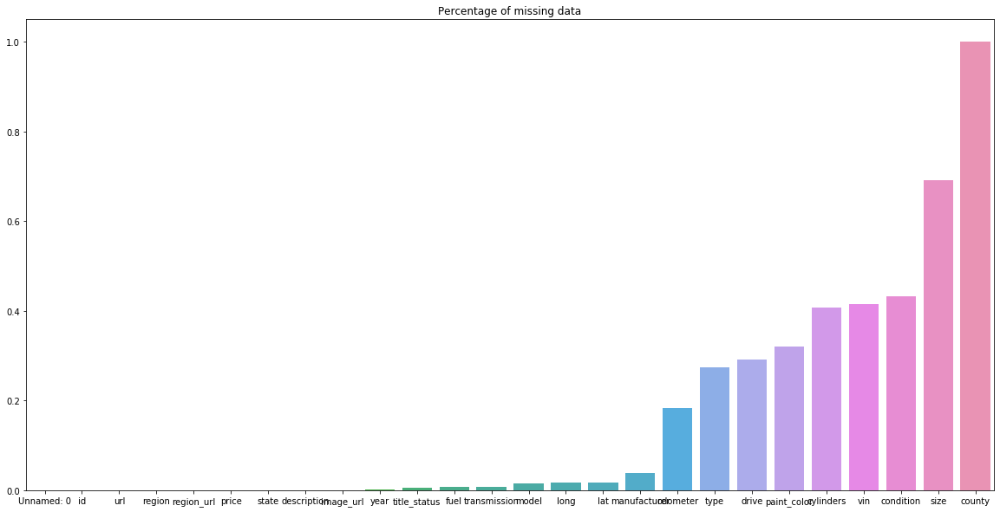

In [202]:
#Displaying number of nulls in percentage bargraph
numberOfNulls = df.isnull().sum().sort_values(ascending=True).div(len(df))
plt.figure(figsize=(20,10))
sns.barplot(x=numberOfNulls.index, y=numberOfNulls.values)
plt.title("Percentage of missing data")
plt.show()

In [203]:
df.head()

,Unnamed: 0,id,url,region,region_url,price,year,manufacturer,model,condition,...,drive,size,type,paint_color,image_url,description,county,state,lat,long
0,95499,7088111186,https://mobile.craigslist.org/ctd/d/mobile-201...,mobile,https://mobile.craigslist.org,13950,2011.0,jeep,grand cherokee,excellent,...,rwd,NaN,SUV,NaN,https://images.craigslist.org/00g0g_hyUIVlBkjs...,2011 *** Jeep Grand Cherokee Limited SUV *** ...,NaN,al,30.6869,-88.2162
1,218089,7077594766,https://treasure.craigslist.org/ctd/d/melbourn...,treasure coast,https://treasure.craigslist.org,1000,2013.0,kia,optima,NaN,...,NaN,NaN,NaN,NaN,https://images.craigslist.org/01111_i0reK48zZ9...,TAX TIME SPECIAL!!!! 30TH YEAR ANNIVERSARY!!!!...,NaN,fl,28.1384,-80.6524
2,112125,7091613207,https://lexington.craigslist.org/ctd/d/finchvi...,lexington,https://lexington.craigslist.org,8490,2009.0,bmw,535xi,like new,...,4wd,full-size,sedan,blue,https://images.craigslist.org/00U0U_1A4UQ6Yjhc...,"2009 535xi BMW, All Wheel Drive, TanLeather In...",NaN,ky,38.0970,-85.3645
3,150313,7091696550,https://orlando.craigslist.org/ctd/d/tampa-201...,orlando,https://orlando.craigslist.org,36998,2017.0,ford,f-450,NaN,...,fwd,NaN,other,white,https://images.craigslist.org/00q0q_9aXLEGf6Tg...,2017 Ford F-450 Super Duty 4X2 4dr Crew Cab 17...,NaN,fl,28.0157,-82.4598
4,428076,7086364258,https://tulsa.craigslist.org/ctd/d/tulsa-2018-...,tulsa,https://tulsa.craigslist.org,40044,2018.0,chevrolet,silverado 1500,NaN,...,4wd,NaN,NaN,white,https://images.craigslist.org/00707_j4fmGFUS0C...,Mark Allen Chevrolet address: 8300 New Sapu...,NaN,ok,36.0446,-96.0783


In [205]:
df = df.drop(['url', 'region_url', 'size', 'image_url', 'description', 'county'], axis=1)

In [206]:
from vehicle_makes import get_makes_and_models
makes_and_models = get_makes_and_models()

In [207]:
manufacturer_index=df[df["manufacturer"].isnull()].index.tolist()

In [208]:
df1 = copy.deepcopy(df)

In [209]:
for i in manufacturer_index:
    indicator=False
    for brands,models in makes_and_models.items():
        if brands.lower() in df1.at[i, 'model'].lower() and brands.lower()!='ac':
            #print(brands)
            indicator=True
            df1.at[i, 'manufacturer']=brands.lower()
            continue
        else:
            
            for types in models:
                
                if types.lower() in df1.at[i, 'model'].lower() and len(types)>2:
                   indicator=True 
                   df1.at[i, 'manufacturer']=brands.lower()
        if indicator== False:
            df1.at[i, 'manufacturer']="Unknown"

In [210]:
df1["year"].fillna(0, inplace=True)
df1["year"] = df1["year"].astype("int32")

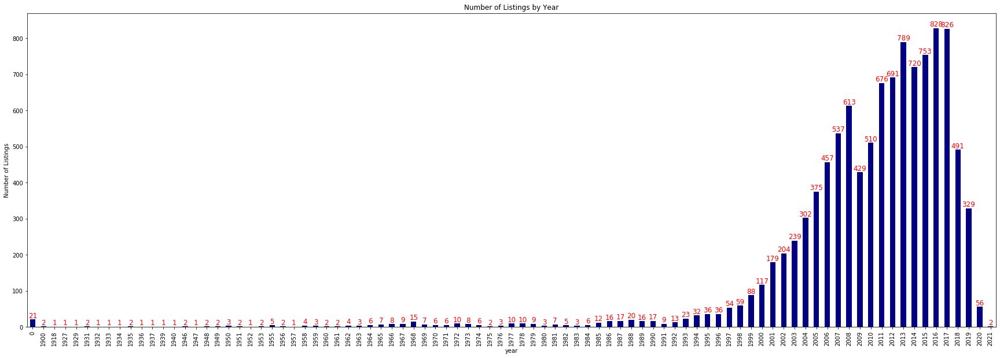

In [211]:
ay= df1.groupby(['year'])['id'].count().plot(kind='bar',label='index',colormap='jet',title="Number of Listings by Year", figsize = [30,10])
ay.set_ylabel("Number of Listings")

for p in ay.patches:
    ay.text(p.get_x() + p.get_width()/2., p.get_height(), '%d' % int(p.get_height()), 
            fontsize=12, color='red', ha='center', va='bottom')

In [212]:
display(df1[df1['year']==2021])

,Unnamed: 0,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,type,paint_color,state,lat,long
3354,54532,7083766383,janesville,800,2021,Unknown,Janesville,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,wi,42.6683,-89.0025
3535,138606,7090246929,maine,100,2021,Unknown,Any,NaN,NaN,other,NaN,clean,other,NaN,NaN,NaN,NaN,me,43.7340,-70.2625


In [213]:
#Conidering model of the car between 1965 and 2020 (including) 
df_post_1965 = df1[df1['year'] >= 1965]
df_post_1965 = df_post_1965[df_post_1965['year'] < 2021]

In [214]:
len(df_post_1965)

10709

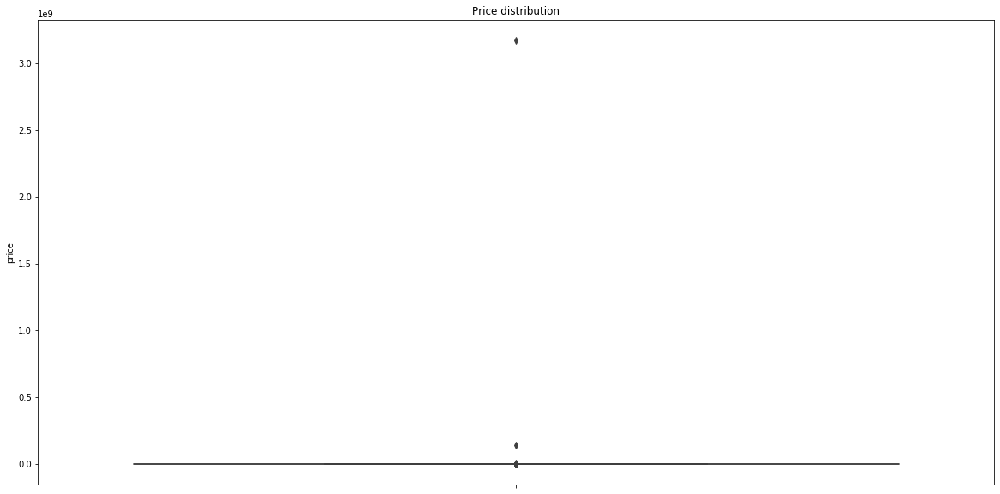

count    1.070900e+04
mean     3.214211e+05
std      3.063860e+07
min      0.000000e+00
25%      4.200000e+03
50%      9.500000e+03
75%      1.770000e+04
max      3.167547e+09
Name: price, dtype: float64

In [215]:
plt.figure(figsize=(20,10))
box_plot = sns.boxplot(y='price', data=df_post_1965, whis = 1.5)
                       #, showfliers = False)
plt.title("Price distribution")
plt.show()
box_plot.figure.tight_layout()
df_post_1965['price'].describe()

In [216]:
display(df_post_1965[df_post_1965['price']>200000])

,Unnamed: 0,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,type,paint_color,state,lat,long
2218,246546,7085990353,chico,3167547323,2013,volvo,xc60,excellent,NaN,gas,152778.0,clean,automatic,YV4902DZ9D2387750,4wd,SUV,blue,ca,38.7381,-121.2900
5365,31589,7092184862,brownsville,1111111,2012,toyota,NaN,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,tx,25.9504,-97.3217
6243,317043,7091862220,humboldt county,140008000,2006,chevrolet,06 Silverado/99 Tahoe,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,ca,40.7420,-124.1990
9262,374225,7093000659,orange county,475000,2008,chevrolet,silverado,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,ca,33.7059,-117.8450


In [217]:
df_pr_range = df_post_1965[df_post_1965.price <= 200000]

In [218]:
len(df_pr_range)

10705

In [219]:
display(df_pr_range[(df_pr_range['price'] == 0) & ((df_pr_range['odometer'] == 0) | (df_pr_range['odometer'].isnull()))])

,Unnamed: 0,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,type,paint_color,state,lat,long
24,338568,7086497269,el paso,0,2003,hummer,hummer h2,new,8 cylinders,gas,NaN,clean,automatic,5GRGN230X3H108723,4wd,SUV,white,tx,31.7432,-106.3690
74,226195,7090272566,cincinnati,0,2012,ford,e250 econoline,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,oh,39.3224,-84.5033
108,531864,7080167219,rochester,0,2012,gmc,acadia,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,ny,43.2005,-77.5720
168,136753,7092707269,phoenix,0,2016,toyota,tacoma sr5,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,az,33.5103,-112.0560
179,498552,7081713527,zanesville / cambridge,0,2019,ford,transit,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,oh,39.9274,-82.0041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10512,235131,7081304703,delaware,0,2009,ford,escape,NaN,NaN,other,NaN,clean,automatic,NaN,NaN,NaN,white,de,39.8857,-75.3082
10533,216260,7092603893,detroit metro,0,2019,rover,🔴100% APPROVAL RATE🔴,new,other,other,NaN,clean,other,NaN,rwd,other,custom,mi,NaN,NaN
10562,191926,7088897903,rochester,0,2013,ford,f-150,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,ny,43.2005,-77.5720
10596,143928,7090720960,san antonio,0,2019,chevrolet,NaN,NaN,NaN,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,tx,29.5054,-98.6688


In [220]:
df_pr_range1 = df_pr_range.drop(df_pr_range[(df_pr_range['price'] == 0) & ((df_pr_range['odometer'] == 0) | (df_pr_range['odometer'].isnull()))].index, axis=0)

In [221]:
len(df_pr_range1)

10479

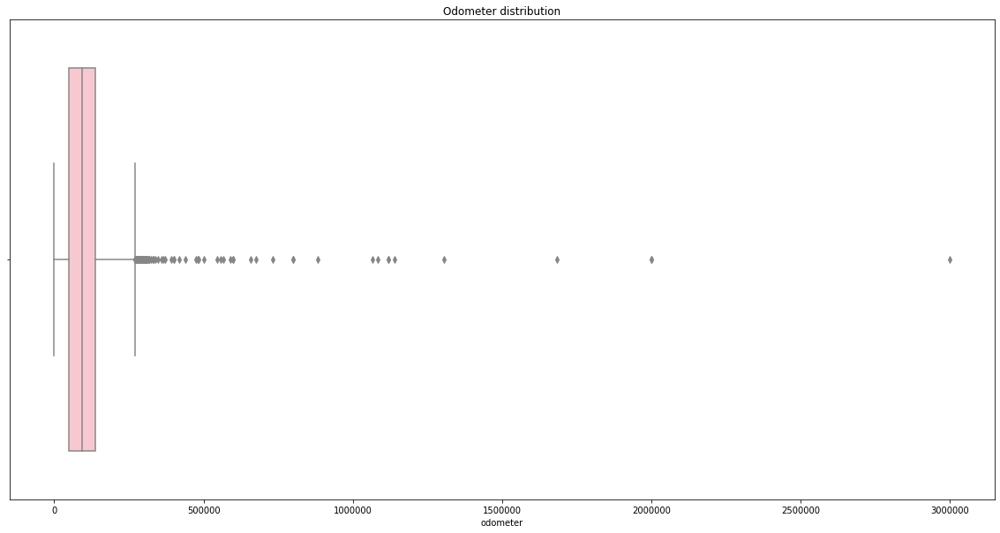

count    8.753000e+03
mean     1.009526e+05
std      8.368505e+04
min      0.000000e+00
25%      4.911800e+04
50%      9.440000e+04
75%      1.374760e+05
max      3.000051e+06
Name: odometer, dtype: float64

In [222]:
plt.figure(figsize=(20,10))
box_plot = sns.boxplot(x='odometer', data=df_pr_range1, whis = 1.5, color = 'pink')
plt.title("Odometer distribution")
plt.show()
box_plot.figure.tight_layout()
df_pr_range1['odometer'].describe()

In [223]:
vc=df_pr_range1[df_pr_range1['odometer'].notnull()]
vc['pr_od_ratio'] = vc['price']/vc['odometer']
initial_filter=copy.deepcopy(vc.groupby(["manufacturer","model","year"]))
second_filter=copy.deepcopy(vc.groupby(["manufacturer","model"]))

odometre_index=list(df_pr_range1[df_pr_range1['odometer'].isnull()].index)
first_filter={}
second_f={}
for k,v in initial_filter:
    first_filter[k]=v["pr_od_ratio"].median()
for k,v in second_filter:
    second_f[k]=v["pr_od_ratio"].median() 
for ind in odometre_index:
    manuf=df_pr_range1.at[ind,"manufacturer"]
    model=df_pr_range1.at[ind,"model"]
    year=df_pr_range1.at[ind,"year"]
    if (manuf,model,year) in first_filter.keys():
        df_pr_range1.at[ind,"odometer"]= df_pr_range1.at[ind,"price"]/first_filter[(manuf,model,year)]
    elif (manuf,model) in second_f.keys():
        df_pr_range1.at[ind,"odometer"]=  df_pr_range1.at[ind,"price"]/second_f[(manuf,model)]

C:\Users\Harsh\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Harsh\anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning:

divide by zero encountered in true_divide

C:\Users\Harsh\anaconda3\lib\site-packages\ipykernel_launcher.py:20: RuntimeWarning:

divide by zero encountered in true_divide



In [224]:
#Dropping records with odometer value >320K
car = df_pr_range1.drop(df_pr_range1[(df_pr_range1['odometer'] > 320000)].index, axis=0)

In [225]:
#Created bins column for odometer value named 'odo_bins' and formatted it
interval_range = pd.interval_range(start=0, freq=10000, end=320000)
car['odo_bins'] = pd.cut(car['odometer'], bins=interval_range, labels=[1,2,3])
car['odo_bins'] = car['odo_bins'].astype(str)
car['odo_bins'] = car['odo_bins'].map(lambda x: x.lstrip('(').rstrip(']').replace(',',' to'))

In [226]:
#Converted state to Upper Case
car['state'] = car['state'].str.upper()

In [227]:
#converted cylinder values from string to int and assigning 999 for all NaN values
def cylinders(row):
     if type(row["cylinders"]) is str:
         cyl = re.findall(r"(\d) cylinders", row["cylinders"])
         if len(cyl) != 0:
             return int(cyl[0])
         else:
             return 999
     else:
         return 999
        
car["cylinders"] = car.apply(cylinders,axis=1)

In [228]:
#Created new column to fetch upper range from odo_bins. To have a more readable format
car['odo_bins_up_range']=car['odo_bins'].map(lambda x: x if x == 'nan' else x.split("to")[1][:-6])
car.drop(car[car['manufacturer']=="Unknown"].index, axis=0, inplace=True)
len(car)

10234

In [229]:
#Created 3 levels of filter to substiture price = 0 with correct value based on satisifed filter  
first_filter=copy.deepcopy(car.groupby(["manufacturer","model","year","odo_bins_up_range"]))
second_filter=copy.deepcopy(car.groupby(["manufacturer","model","year"]))
third_filter=copy.deepcopy(car.groupby(["manufacturer","model"]))

In [230]:
id_price_0=list(car[car.price==0].index)
dropped_count=0
model_not_present_count=0
for i in id_price_0:
    manuf=car.at[i,"manufacturer"]
    model=car.at[i,"model"]
    year=car.at[i,"year"]
    odo_bins_up_range=car.at[i,"odo_bins_up_range"]
    if str(model)=='nan':
        model_not_present_count+=1
        car.drop(i,axis=0,inplace=True)
        continue
        
    
    else:    
        
        if len(first_filter.get_group((manuf,model,year,odo_bins_up_range))[first_filter.get_group((manuf,model,year,odo_bins_up_range))["price"]>0])>1:
            price=first_filter.get_group((manuf,model,year,odo_bins_up_range))[first_filter.get_group((manuf,model,year,odo_bins_up_range))["price"]>0]["price"].median()
            car.at[i,"price"]=price   
        elif len(second_filter.get_group((manuf,model,year))[second_filter.get_group((manuf,model,year))["price"]>0])>1:
            price=second_filter.get_group((manuf,model,year))[second_filter.get_group((manuf,model,year))["price"]>0]["price"].median()
            car.at[i,"price"]=price 
        elif len(third_filter.get_group((manuf,model))[third_filter.get_group((manuf,model))["price"]>0])>1:
            price=third_filter.get_group((manuf,model))[third_filter.get_group((manuf,model))["price"]>0]["price"].median()
            car.at[i,"price"]=price 
   
        else:
            car.drop(i,axis=0,inplace=True)
            dropped_count+=1
print("total rows dropped from the dataframe are %d"%(dropped_count+model_not_present_count))
print("total records where model is null and price left unchanged are %d"%(model_not_present_count))

total rows dropped from the dataframe are 160
total records where model is null and price left unchanged are 7


In [231]:
len(car)

10074

In [232]:
#Replacing Null values with Unknown
car["drive"].fillna('Unknown', inplace=True)
car["type"].fillna('Unknown', inplace=True)
car["paint_color"].fillna('Unknown', inplace=True)
car["condition"].fillna('Unknown', inplace=True)
car["title_status"].fillna('Unknown', inplace=True)
car["transmission"].fillna('Unknown', inplace=True)

In [233]:
#Fetching age of the car from the model year
currYear = datetime.now()
currYear = currYear.year
car['age']=car['year'].map(lambda x: currYear-x)

In [234]:
car

,Unnamed: 0,id,region,price,year,manufacturer,model,condition,cylinders,fuel,...,vin,drive,type,paint_color,state,lat,long,odo_bins,odo_bins_up_range,age
0,95499,7088111186,mobile,13950,2011,jeep,grand cherokee,excellent,6,gas,...,1J4RS5GG0BC745781,rwd,SUV,Unknown,AL,30.6869,-88.2162,90000.0 to 100000.0,10,9
1,218089,7077594766,treasure coast,1000,2013,kia,optima,Unknown,999,gas,...,NaN,Unknown,Unknown,Unknown,FL,28.1384,-80.6524,10000.0 to 20000.0,2,7
2,112125,7091613207,lexington,8490,2009,bmw,535xi,like new,6,gas,...,WBANV93539C134030,4wd,sedan,blue,KY,38.0970,-85.3645,90000.0 to 100000.0,10,11
3,150313,7091696550,orlando,36998,2017,ford,f-450,Unknown,999,diesel,...,1FD0W4GT2HED79843,fwd,other,white,FL,28.0157,-82.4598,110000.0 to 120000.0,12,3
4,428076,7086364258,tulsa,40044,2018,chevrolet,silverado 1500,Unknown,999,gas,...,3GCUKTEJ4JG133694,4wd,Unknown,white,OK,36.0446,-96.0783,30000.0 to 40000.0,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10790,9492,7081791086,winchester,5995,2010,toyota,corolla,excellent,4,gas,...,2T1BU4EE8AC251994,fwd,sedan,red,VA,38.9674,-78.4096,140000.0 to 150000.0,15,10
10791,109272,7093456651,phoenix,10990,2016,hyundai,sonata,good,4,gas,...,5NPE34AF7GH401727,fwd,sedan,white,AZ,33.5699,-112.0650,100000.0 to 110000.0,11,4
10792,20410,7089890157,south jersey,3500,2007,nissan,maxima,good,6,gas,...,NaN,rwd,sedan,grey,NJ,39.8689,-75.0944,100000.0 to 110000.0,11,13
10793,129480,7075592576,laredo,9995,2019,ford,edge,Unknown,999,gas,...,2FMPK3G91KBB32292,fwd,SUV,Unknown,TX,29.1485,-98.8759,20000.0 to 30000.0,3,1


# Exploratory Data Analysis

#### Price Distribution

In [235]:
fig = px.histogram(car, x="price", marginal="rug", hover_data=car.columns)
fig.show()

##### The price is highly skewed to the right with the mean price of 13633 and median price of 10995 dollars. Most of the prices are concentrated in the range of 3K to  9K.

#### Odometer Distribution

In [236]:
fig = px.histogram(car, x="odometer", marginal="rug", hover_data=car.columns)
fig.show()

##### The odometer range is skewed to the right with the mean value of 97710 and median of 93416 miles. Most of the car have their odometer range in 22.5K to 132.5K. Post that odometer range, since there is a gradual decrease in the number of cars being sold on Craigslist, it can be inferred that after driving 130K miles, people prefer to drive further rather than selling off the car.

#### Top 10 Regions with most listings

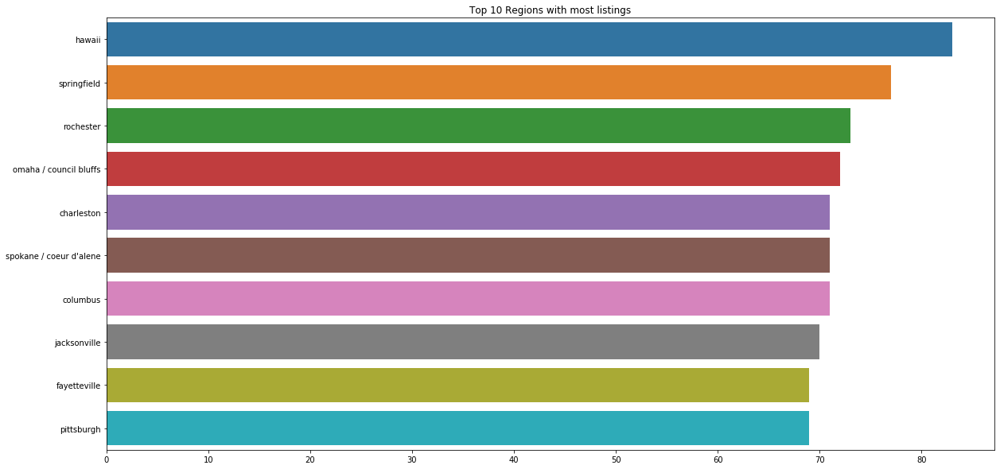

In [144]:
topRegions = car['region'].value_counts().iloc[:10]
plt.figure(figsize=(20,10))
sns.barplot(y=topRegions.index, x=topRegions.values)
plt.title("Top 10 Regions with most listings")
plt.show()

#### Top 10 Brands with most listings

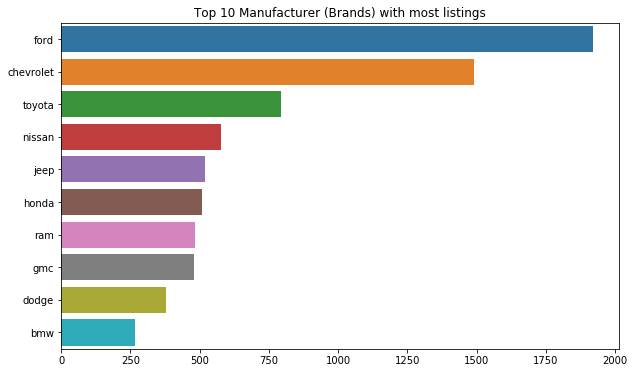

In [145]:
topManufacturer = car['manufacturer'].value_counts().iloc[:10]
plt.figure(figsize=(10,6))
ax = sns.barplot(y=topManufacturer.index, x=topManufacturer.values)
plt.title("Top 10 Manufacturer (Brands) with most listings")
plt.show()

##### Top 10 brands with the most listings shows the poplarity of each around the country. The preferred manufacturer for most of the buyers would be the American brands Ford and Chevrolet. Also, since there are more number of listings for Ford and Chevy, there might be higher margin/re-sell price for the brands.

In [306]:
d = {'manufacturer': ['ford', 'chevrolet', 'toyota', 'nissan', 'jeep']}
topBrands = pd.DataFrame(data=d)
result = pd.merge(topBrands, car, how='left', on=['manufacturer'])

In [307]:
fig = px.scatter(result, x='odometer', y='price', color='manufacturer',
              hover_data=['price', 'odometer'], labels={'Price-Odometer Trend'}, size_max=55)
fig.show()

##### On comapring the top 5 brands in the above scatter plot, we see that most of the ford cars are priced higher followed by Chevrolet than all the other brands. This indicates good demand for Ford cars which is why prices are set high by the sellers. Also, as we move further down the right, Ford prices are still higher than the other cars which denotes a good demand for Ford cars even after being driven for 150K miles and leads to conclusion that Ford cars live longer on roads. Chevrolet follows a similar trend. This drives our final conclusion of market being good for Ford and Chevy.

Text(0.5, 1.0, 'Top 10 age of car listings')

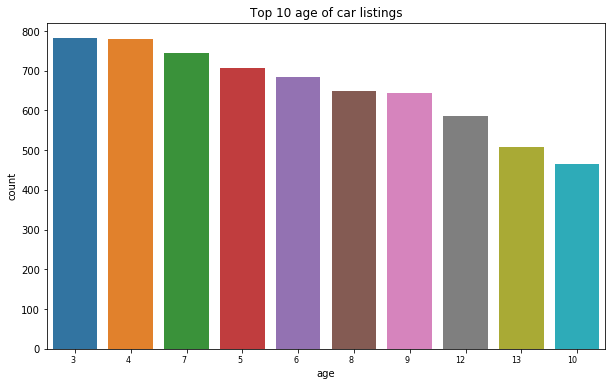

In [146]:
plt.figure(figsize=(10,6))
topYear = car['age'].value_counts().iloc[:10]
topYear = pd.DataFrame({'age' : topYear.index.astype(int), 'count' : topYear.values.astype(int)})
ax = sns.barplot(x='age', y='count', data=topYear, order = topYear['age'])
ax.set_xticklabels(ax.get_xticklabels(), ha="right",fontsize=8)
plt.title("Top 10 age of car listings")

##### Most of the cars listed on the website are early in their age. With most of the listings being of age 3 and 4 which corresponds to 2017 and 2016 models respectively, it can be highly likely that major upgrades have been brought by brands in 2018 models and people want to sell the older model to buy the 2018 and newer model. Also, the possibility of being an overall bad car assembled in 2016 and 2017 could be the reason to let go the car early in its age.

#### Percentage of car listings falling in Odometer range

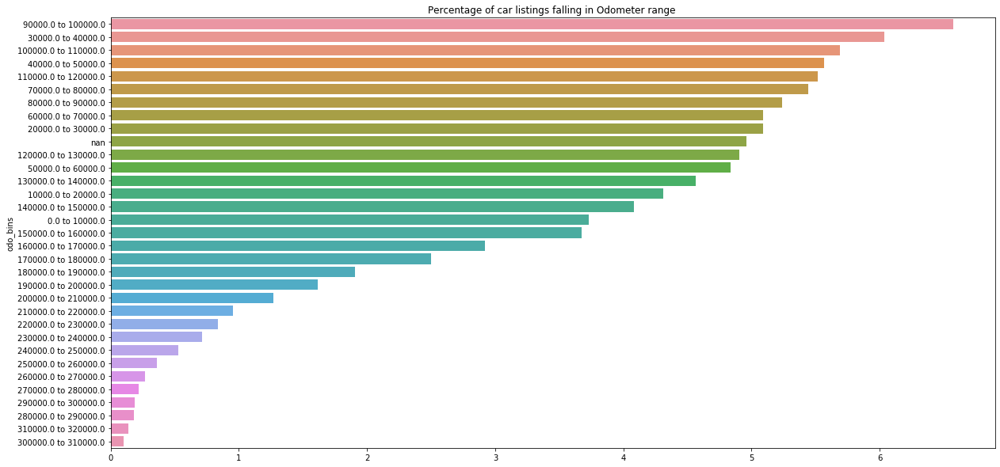

In [184]:
cot = car.groupby(['odo_bins']).id.count().mul(100).sort_values(ascending=False).div(len(car))
plt.figure(figsize=(20,10))
sns.barplot(x=cot.values, y=cot.index)
plt.title("Percentage of car listings falling in Odometer range ")
plt.show()

##### The above graph indicates that most sellers sell of their car just before the 100K mark on their odometer. My hypothesis is that approaching to the 100K miles warranty-end mark makes sellers list their car for sale. Most of the brands offer 100K miles warranty and sellers would like to sell off at a higher price comparatively before the end of warranty. Post 100K miles, cars might be losing a lot more value than the former case. 
##### The next bar indicates that many people are listing thier cars just after driving 30K-40K miles. This could be tied up to our previous analysis of 2016 and 2017 car models being sold because of major changes brought in 2018 models. (Assuming the average of car being driven in a year to be 12K miles, it is conclusive that 2016 and 2017 models would have been driven in the range of 30K-40K miles) 

In [308]:
car.groupby(['manufacturer','model','year']).agg({'price':['mean','count']}).sort_values(('price','count'), ascending=False)[:10]

price      
                                          mean count
manufacturer model          year                    
ford         f-150          2010  12024.916667    24
                            2013  16066.347826    23
                            2011  13881.700000    20
                            2014  18724.150000    20
                            2015  25648.187500    16
chevrolet    silverado 1500 2016  23517.000000    15
ram          1500           2015  21246.533333    15
ford         f-150          2012  15485.266667    15
chevrolet    silverado 1500 2014  19456.714286    14
jeep         wrangler       2008  12553.000000    13

##### We have the highest listings of Ford f-150 (2010-2015) models  years in our most selling cars. Ford f-150 looks to be a huge success with higher average resell price than the industry average. Three assumptions are that:
##### 1. Most of them prefer buying American car and might be sold quickly, leaving the inventory fast
##### 2. Ford has constantly improved its model every year and people have liked it making it the top and best resell car
##### 3. As we earlier saw in the scatterpot, Ford runs for a long mileage which makes buyer like the model and seller would be ready to pay higher than the industry average price
##### Since, Chevy Silverado sits in the 6th place of the listings, it can be fair to assume that Chevy might have brought a major update in 2017 and newer model, which compels seller sell their 2016 car.

#### Price Plot by Type of Car

Text(0.5, 1, 'Price Plot by Type of Car')

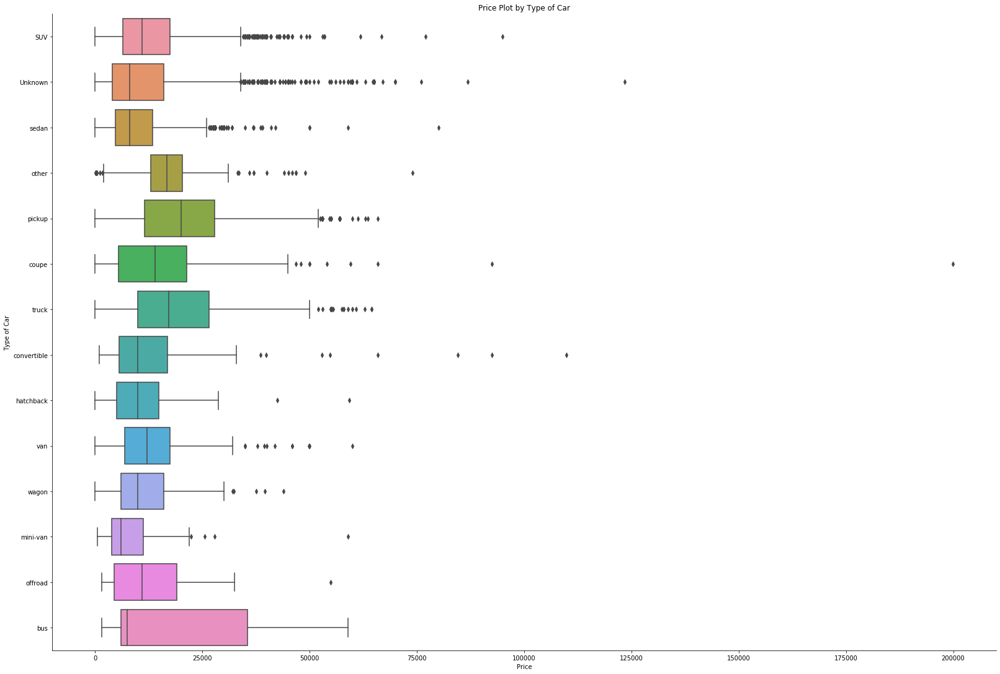

In [148]:
mx = sns.catplot(y='type', x="price", data=car, kind="box",height=15 ,aspect=1.5)
mx.set(xlabel='Price')
mx.set(ylabel= 'Type of Car')
plt.title('Price Plot by Type of Car')

##### The boxplot indicates that there is a huge variability in the price for bus and the plot is right skewed which dneotes that most of the prices are close to the value of the 25 percentile price. Similarly for Sedan and mini-van where the variability is low comparatively but are right skewed.

#### Price Plot by Type of Car

Text(0.5, 1, 'Price Plot by Car color')

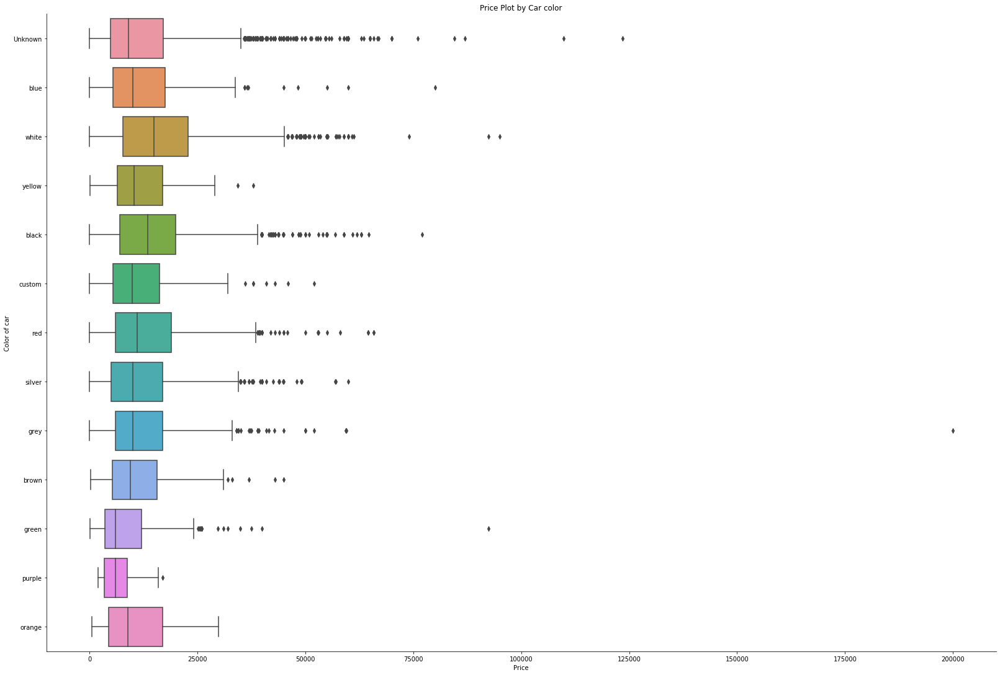

In [149]:
mx = sns.catplot(y='paint_color', x="price", data=car, kind="box",height=15 ,aspect=1.5)
mx.set(xlabel='Price')
mx.set(ylabel= 'Color of car')
plt.title('Price Plot by Car color')

##### Highest median price is for white color followed by black. However, there are many outliers for both the colors which relates to the fact that buyers would be ready to pay higher for these colors and are the most popular amongst everyone. Purple cars do not have much variability in price and are genrally cheaper than all the others cars.  

#### Price Plot by Manufacturer

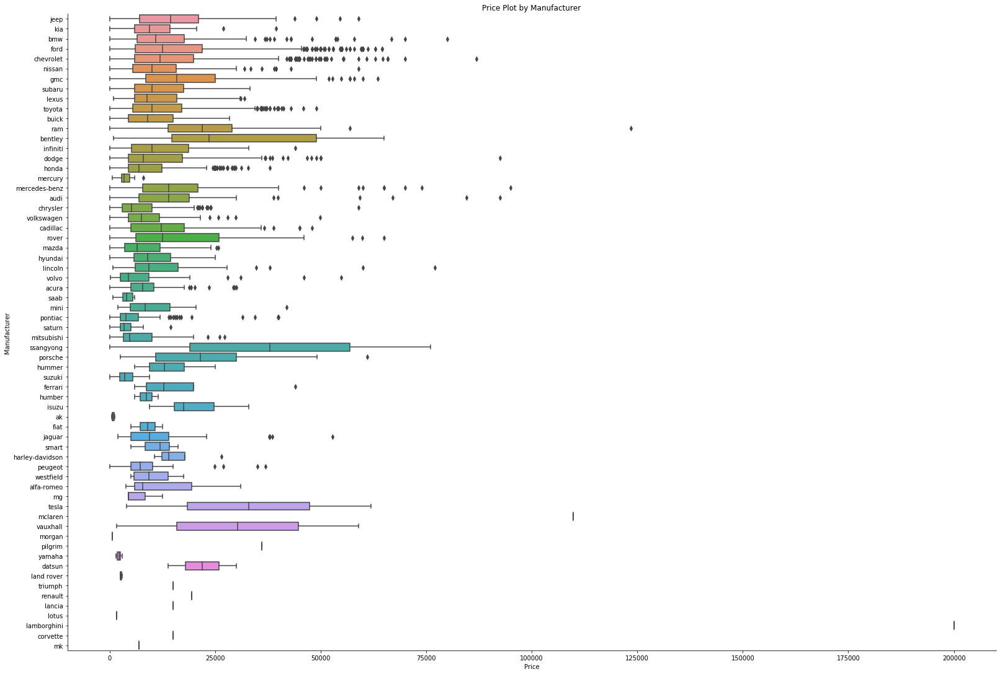

In [150]:
mx = sns.catplot(y="manufacturer", x="price", data=car, kind="box",height=15 ,aspect=1.5)
mx.set(xlabel='Price')
mx.set(ylabel= 'Manufacturer')
plt.title('Price Plot by Manufacturer')
plt.savefig('Price Plot by Manufacturer')

##### Ford which has most listings has high varibaility in its prices, however it is slightly right skewed leading us to conclude that most prices are around 12K. Chevrolet follows the same trend as Ford. The price plot for Ferrari shows that most used Ferrari are seller at cheaper rate. However to evidently conclude that, we would like to know more information like odometer range and model year of the car.

In [156]:
def manufact(i):
    k=car.price[(car.manufacturer==i)].describe().tolist()
    iqr=k[6]-k[4]
    up=k[6]+1.5*iqr
    lb=k[4]-1.5*iqr
    l=(car.price[(car.manufacturer==i)] > up ) | (car.price[(car.manufacturer==i)] < lb )
    return l.sum()

In [157]:
un_manuf = car.manufacturer.unique()
outlier=[manufact(str(j)) for j in un_manuf]
out_df=pd.DataFrame()
out_df['manufacturer']=np.array(un_manuf)
out_df['Outliers']=np.array(outlier)

out_df

,manufacturer,Outliers
0,jeep,4
1,kia,2
2,bmw,16
3,ford,46
4,chevrolet,43
...,...,...
59,lancia,0
60,lotus,0
61,lamborghini,0
62,corvette,0


#### Price plot by State

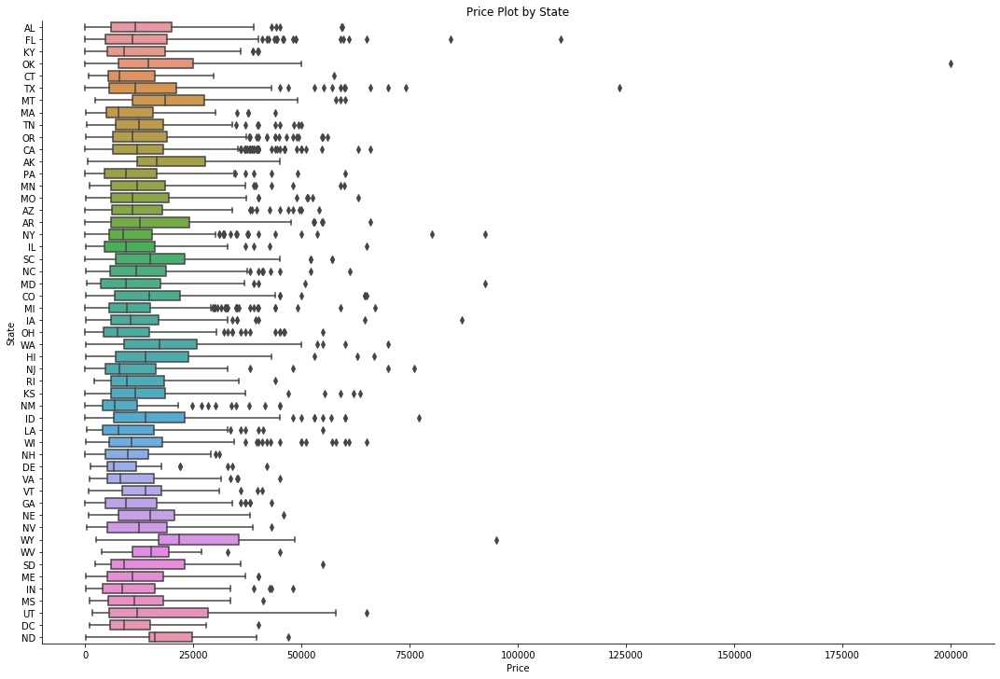

In [158]:
mx = sns.catplot(y="state", x="price", data=car, kind="box",height=10 ,aspect=1.5)
mx.set(xlabel='Price')
mx.set(ylabel= 'State')
plt.title('Price Plot by State')
plt.savefig('Price Plot by State')

##### Most of the states are right skewed that is their mean (average) price is greater than the median (middle after sorting in ascending order) price. The mean price in such cases is higher because of large number of outliers that pulls the mean closer to them. On the other side, NE (Nebraska) has left skewed plot indicating that most prices are focused near the 75 percentile price making it a comparatively expensive state to buy a used car.

#### Odometer Plot by Manufacturer

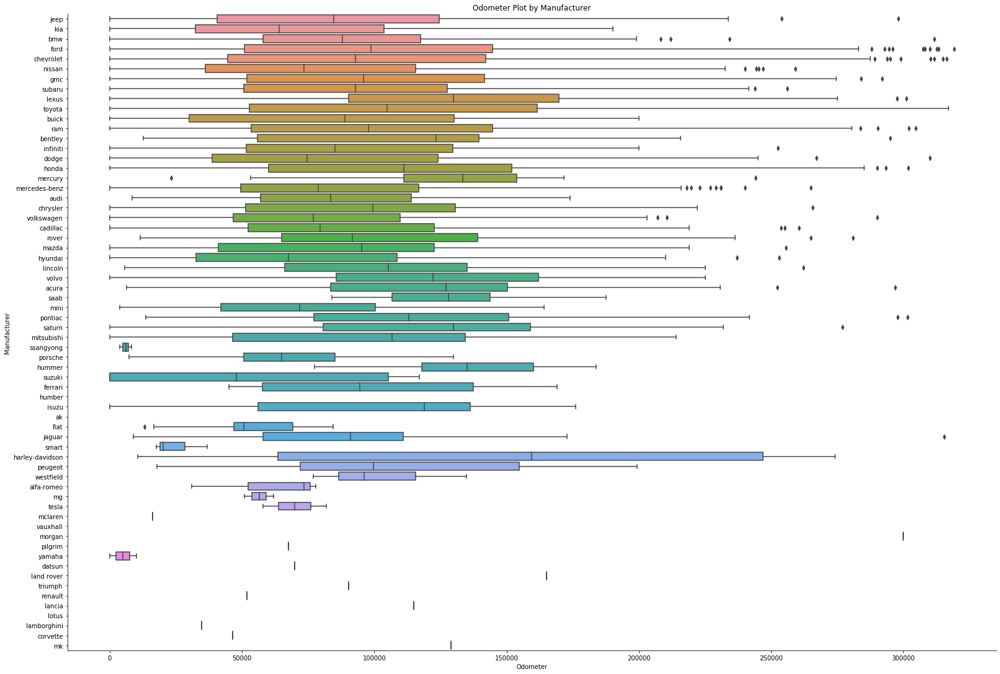

In [159]:
mx = sns.catplot(y="manufacturer", x="odometer", data=car, kind="box",height=15 ,aspect=1.5)
mx.set(xlabel='Odometer')
mx.set(ylabel= 'Manufacturer')
plt.title('Odometer Plot by Manufacturer')
plt.savefig('Odometer Plot by Manufacturer')

##### We can see huge variability in the mileage of most of the manufacturers. Toyota has the highest variability with median around 100K miles. The high end whisker indicates that Toyota runs for a long time on road and genrally sellers sell it off around 100K miles mark. Harley Davidson has the higherst median value indicating it to be a good long run car. For Tesla, median or the middle value of the odometer is around 75K miles which drives my hypothesis that Tesla would be a car for short distances and not being driven more. Also, with more evidence we can say that becasue of the electric charging buyers might want to sell it off early.

#### Mean Price by State

In [161]:
df_mean_price_by_state = round(car.groupby(['state'])['price'].mean().reset_index(name = 'Average Price'), 0)

In [162]:
fig = px.choropleth(df_mean_price_by_state, locationmode="USA-states", locations='state', color='Average Price',
                           color_continuous_scale="Viridis",
                           range_color=(8000, 20000),
                           scope="usa"
                          )
fig.show()

#### Price vs Miles Driven (Odometer)

In [163]:
fig = px.scatter(car, x='odometer', y='price', 
             hover_data=['price', 'odometer'], labels={'Price-Odometer Trend'}, size_max=55)
fig.show()

##### The scatter plot defines a close to negative linear relationship between the price and odometer. It shows an obvious relaitionship that as odometer increases that is as car is more driven, value of the car in dollars decreases. However, there is one outlier with price 200K and miles around 40K which possibly could be a high-end luxury car.

#### Price vs Miles Driven by Transmission

In [164]:
fig = px.scatter(car, x='odometer', y='price', color = 'transmission',
             hover_data=['price', 'odometer'], labels={'Price-Odometer Trend'}, size_max=55)
fig.show()



##### The above scatterplot defines relationship between price and odometer for different transmission in vehicles. It is noticed that automatic tranmission vehicles have higher value and longer life as compared to other transmission which indicates high demand for such vehicles. Cars with manual transmission have lower price as compared to automatic for the same odometer value. This leads to conclusion that people prefer auto over manual and with increase in number of automatic cars in recent years, number of manual transmission buyers and sellers listing them is expected to be going down in future.

#### Mean price by Age of car

In [165]:
age_mean_price = round(car.groupby(by='age')['price'].mean().reset_index(name="mean price"), 0)

In [166]:
fig = px.scatter(age_mean_price, x='age', y='mean price', 
             hover_data=['mean price', 'age'], labels={'Price-Age Trend'})
fig.show()

##### The plot gives an obvious insight of mean price decreasing as the age of the car increases. In the initial 10 years of the car, the price drops significantly and later on in the next 20 years, the curve has flattened indicating a slow decrease in the price. Also, after 40 years of age, we see a sudden increase in the price of the car which could be an indiactor of antique cars being sold at a higher price. It can be in high demand as sellers might be ready to pay a higher price for owning an antique car.

#### Price Plot by Year

Text(0.5, 1.0, 'Price plot by year')

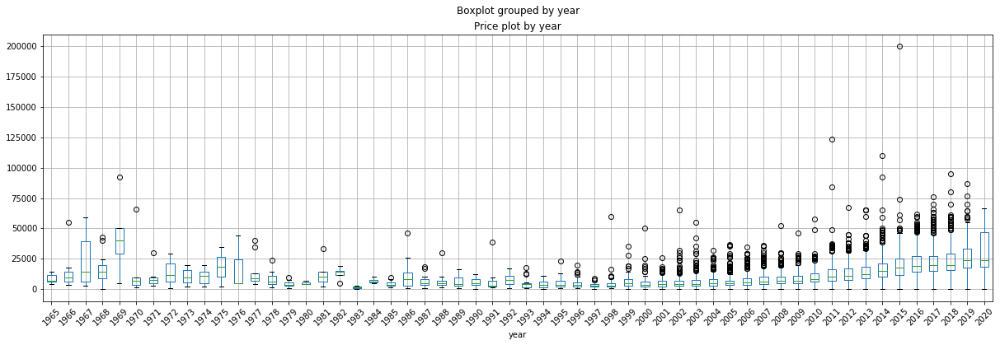

In [170]:
car.boxplot(column='price',by='year',fontsize=10,figsize=(20,6),rot=45)
plt.title('Price plot by year')
plt.ylabel('Price')

##### The variability in price rises for the newer models and prices increases as the age of the vehicle decreases.

#### Price Plot by Fuel type

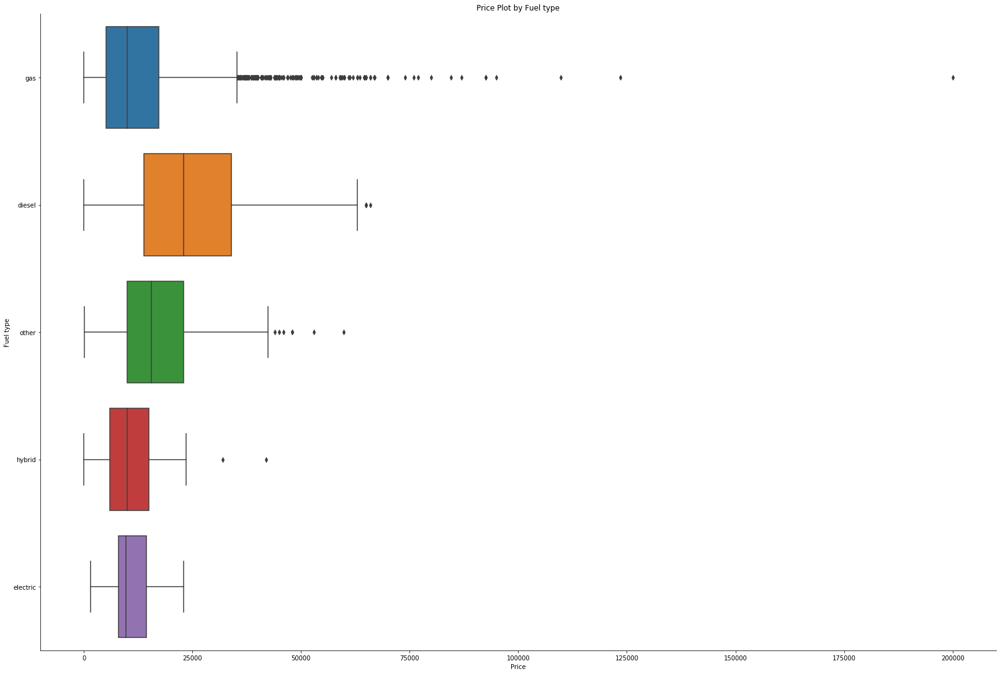

In [171]:
mx = sns.catplot(y="fuel", x="price", data=car, kind="box",height=15 ,aspect=1.5)
mx.set(xlabel='Price')
mx.set(ylabel= 'Fuel type')
plt.title('Price Plot by Fuel type')
plt.savefig('Price Plot by Fuel type')

##### The price plot for diesel in nearly symmetric indicating median price to be around 24K. Though we have outliers or extreme prices for gas vehicles, diesel cars in general are costlier than all the other vehicles.

#### Odometer plot by Fuel type

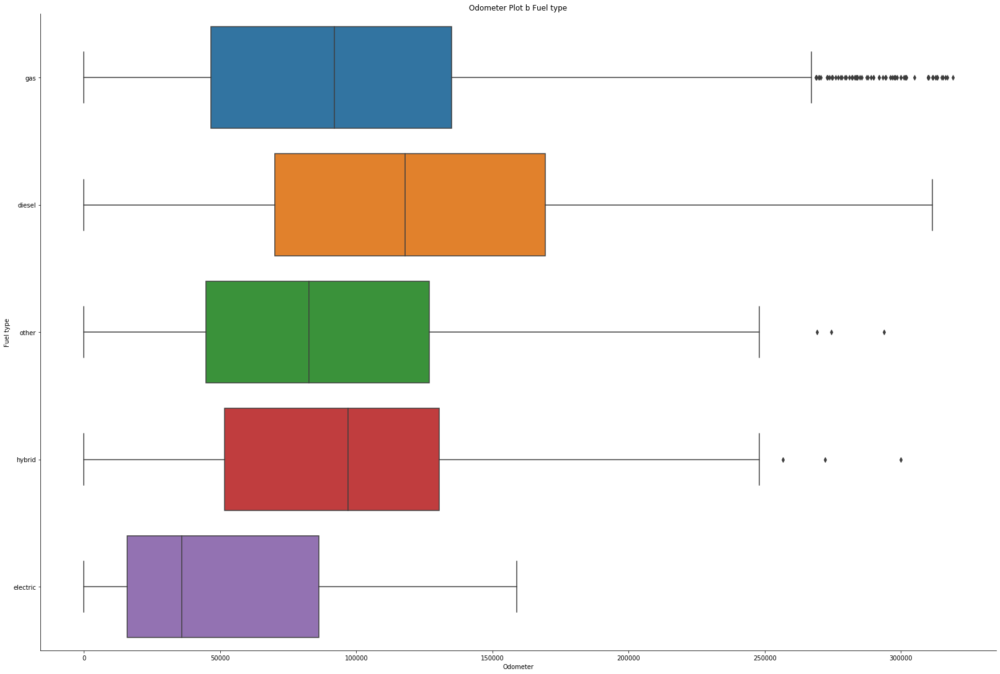

In [172]:
mx = sns.catplot(y="fuel", x="odometer", data=car, kind="box",height=15 ,aspect=1.5)
mx.set(xlabel='Odometer')
mx.set(ylabel= 'Fuel type')
plt.title('Odometer Plot b Fuel type')
plt.savefig('Odometer Plot by Fuel type')

##### Diesel cars have higher mileage capacity as compared to gas vehicles as the maximum range for diesel cars is more than the gas vehicles. Eletric vehicles generally have lower range are sold off early in thier age indicating a possibilty of higher maintenance cost after driving a set number of miles.

#### Manual vs Auto Transmission Listings by State

In [173]:
manual=car[car.transmission=='manual']
auto=car[car.transmission=='automatic']
man_count = manual.groupby(by=['state',])['state'].count().reset_index(name="count")
auto_count = auto.groupby(by='state')['state'].count().reset_index(name="count")

In [174]:
fig = go.Figure(data=[
    go.Bar(name='Automatic', x=auto_count['state'], y=auto_count['count'], text = auto_count['count'], textposition='auto'),
    go.Bar(name='Manual', x=man_count['state'], y=man_count['count'], text=man_count['count'], textposition='auto')
])
fig.update_layout(barmode='stack')
fig.show()

##### All the states have majority of the automatic cars listings with California being on the top.

#### Average Price by condition and transmission category

In [178]:
cond_tran_price = car.groupby(by=['condition', 'transmission'])['price'].mean().reset_index(name="mean price")

In [179]:
cond_tran_price = cond_tran_price.pivot("condition", "transmission", "mean price")

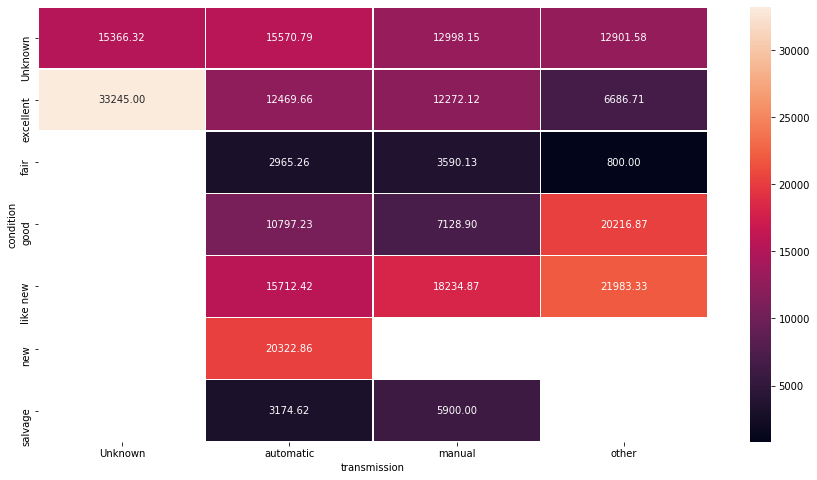

In [180]:
f, ax = plt.subplots(figsize=(15, 8))
sns.heatmap(cond_tran_price, annot=True, fmt=".2f", linewidths=.5, ax=ax)

##### The heatmap shows that automatic car in salvage condition is sold at a way lesser price as compared to manual. This could be because automatic cars in a disabled condition are more expensive to fix than manual cars in same condition which is why buyers would not be willing to pay a higher price.